In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import datetime as dt
import re

import matplotlib.pyplot as plt
from matplotlib import cm

import folium
from folium.plugins import MarkerCluster

In [2]:
# import dataset
cal_accident_df = pd.read_csv('csv/clean_data.csv')
cal_accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Severity           30000 non-null  int64  
 1   Start_Time         30000 non-null  object 
 2   Start_Lat          30000 non-null  float64
 3   Start_Lng          30000 non-null  float64
 4   Street             30000 non-null  object 
 5   City               30000 non-null  object 
 6   County             30000 non-null  object 
 7   Zipcode            30000 non-null  int64  
 8   Humidity(%)        30000 non-null  float64
 9   Wind_Direction     30000 non-null  float64
 10  Weather_Condition  30000 non-null  object 
 11  Amenity            30000 non-null  bool   
 12  Bump               30000 non-null  bool   
 13  Crossing           30000 non-null  bool   
 14  Give_Way           30000 non-null  bool   
 15  Junction           30000 non-null  bool   
 16  No_Exit            300

# Exploratory Data Analysis

Having cleaned our raw data above, we now have the appropriate data that we can work with.

Our main goal is to predict the `Severity` of the accident based on the different variables that we are given. Thus, we now want to find the relationship of the different variables with the `Severity` of the accident

## Severity


In [3]:
cal_accident_df['Severity'].describe()

count    30000.000000
mean         2.017700
std          0.210051
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: Severity, dtype: float64

Number of Severity levels: 4
Severity
1      162
2    29384
3      215
4      239
Name: count, dtype: int64


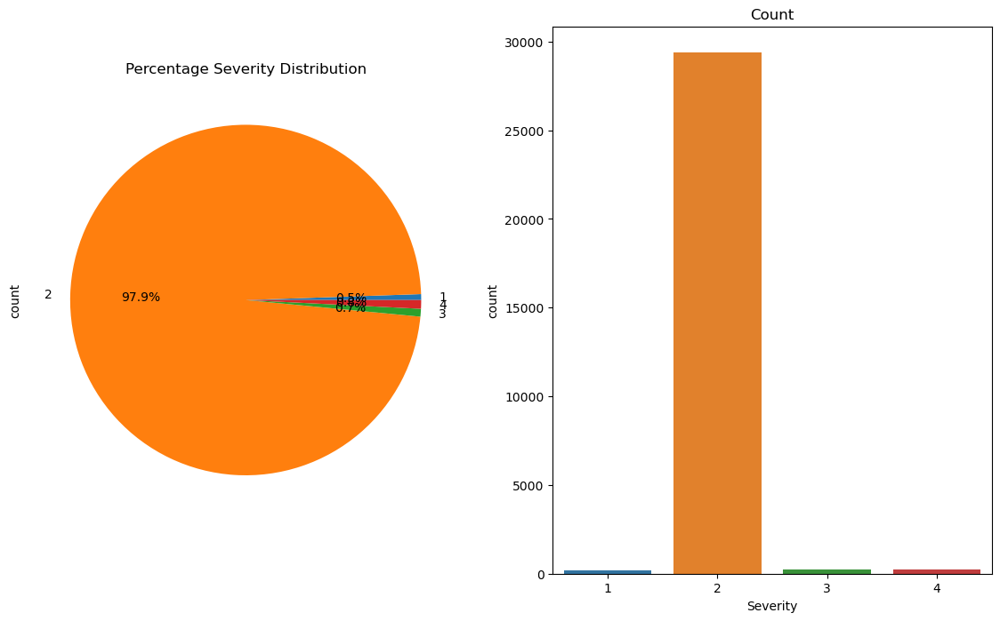

In [4]:
# print count and ratio of total count of the different severity levels
print('Number of Severity levels:', len(cal_accident_df['Severity'].unique()))
print(cal_accident_df['Severity'].value_counts().sort_index())

# plot bar and pie chart
f, axes = plt.subplots(1, 2, figsize=(14, 8))

axes[0].set_title('Percentage Severity Distribution')
cal_accident_df['Severity'].value_counts().sort_index().plot.pie(autopct = '%1.1f%%', ax = axes[0])

axes[1].set_title('Count')
sb.countplot(x = 'Severity', data = cal_accident_df, ax = axes[1])

plt.show()

## Location of accidents

Since we are given `Start_Lat` and `Start_Lng`, we can plot the coordinates on the map.  
The columns `City` and `County` also allows us to see which area has the most accidents

In [5]:
cal_accident_df[['Start_Lat', 'Start_Lng']].describe()

,Start_Lat,Start_Lng
count,30000.000000,30000.000000
mean,35.667759,-119.460624
std,2.142632,1.919719
min,32.567242,-124.300653
25%,33.968107,-121.415803
50%,34.278183,-118.472194
75%,37.715591,-117.919943
max,41.998276,-114.377093


In [10]:
def create_accident_map_with_colors(df_loc):
    """Generate a map with CircleMarkers for accident locations, colored by severity."""
    m = folium.Map(location=[36.7783, -119.4179], width="120%", height="100%", zoom_start=6)
    
    # color scheme for different severity levels 
    severity_colors = {
        1: 'purple',
        2: 'green',
        3: 'orange',
        4: 'red',
    }
    
    for index, row in df_loc.iterrows():
        lat = row['Start_Lat']
        lon = row['Start_Lng']
        severity = row['Severity']
        
        if not pd.isnull(lat) and not pd.isnull(lon) and severity in severity_colors:
            # Get color based on severity
            color = severity_colors[severity]
            
            folium.CircleMarker(
                location=[lat, lon],
                radius=1,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.6
            ).add_to(m)
    return m

create_accident_map_with_colors(cal_accident_df.sample(10000, random_state=20))  # sample 10000 so map don't lag

In [11]:
# Create and display a Folium map with clustered markers for accident locations 
# centered on CA geographical center.
def create_map(df_loc, latitude, longitude, zoom, tiles='OpenStreetMap'):
    """
    Generate a Folium Map with clustered markers of accident locations.
    """
    world_map = folium.Map(location=[latitude, longitude], zoom_start=zoom, tiles=tiles)
    marker_cluster = MarkerCluster().add_to(world_map)

    # Iterate over the DataFrame rows and add each marker to the cluster
    for idx, row in df_loc.iterrows():
        folium.Marker(
            location=[row['Start_Lat'], row['Start_Lng']],
            # You can add more attributes to your marker here, such as a popup
            popup=f"Lat, Lng: {row['Start_Lat']}, {row['Start_Lng']}"
        ).add_to(marker_cluster)

    return world_map

map_CA = create_map(cal_accident_df.sample(10000, random_state=20), 36.77, -119.41, 5)
map_CA

We can see clearly that most accidents occurs in a city such as San Fransisco or Los Angeles. This is followed by roads that are connecting cities together. This makes sense as most cities are heavily populated and thus there will be more accidents. People would also be travelling between cities and this accounts for accidents located at roads connecting cities

### Cities

In [ ]:
print('Number of unique cities:', cal_accident_df['City'].nunique())

accidents_by_county = cal_accident_df.groupby(['City', 'Severity']).size().unstack(fill_value=0)

# Summing up accidents for each county
accidents_by_county.insert(0, 'Total', accidents_by_county.sum(axis=1))

# Printing number of accidents in each county with total
print("Number of accidents in each county:")
print(accidents_by_county.sort_values(by=['Total'], ascending=False).head(20))   # print top 20

### County

In [ ]:
print('Number of unique counties:', cal_accident_df['County'].nunique())

accidents_by_county = cal_accident_df.groupby(['County', 'Severity']).size().unstack(fill_value=0)

# Summing up accidents for each county
accidents_by_county.insert(0, 'Total', accidents_by_county.sum(axis=1))

# Printing number of accidents in each county with total
print("Number of accidents in each county:")
print(accidents_by_county.sort_values(by=['Total'], ascending=False))

### Zipcode

In [ ]:
print('Number of unique zipcode:', cal_accident_df['Zipcode'].nunique())

accidents_by_zipcode = cal_accident_df.groupby(['Zipcode', 'Severity']).size().unstack(fill_value=0)

# Summing up accidents for each county
accidents_by_zipcode.insert(0, 'Total', accidents_by_zipcode.sum(axis=1))

# Printing number of accidents in each county with total
print("Number of accidents in each county:")
print(accidents_by_zipcode.sort_values(by=['Total'], ascending=False))

We can see that the city **Los Angeles** and the county **Los Angeles** has the most accident. The zipcode **900000**, which also represents the area around **Los Angeles** also has the most accidents 

## Weather Condition

In [ ]:
weather_df = cal_accident_df[['Severity', 'Weather']]
accident_by_weather = weather_df.groupby(['Weather', 'Severity']).size().unstack(fill_value=0)
accident_by_weather.insert(0, 'Total', accident_by_weather.sum(axis=1))
print(accident_by_weather)

In [ ]:
f, axes = plt.subplots(1, 2, figsize=(14, 5))

# stacked graph
accident_by_weather.iloc[:,[1,2,3,4]].plot(kind='bar', stacked=True, ax=axes[0], ylabel='count', rot=0)

# pie chart
weather_counts = weather_df['Weather'].value_counts()
axes[1].pie(weather_counts, labels=weather_counts.index, autopct='%1.1f%%', startangle=140)

plt.tight_layout()
plt.show()

In [ ]:
# plot graph based on severity
f, axes = plt.subplots(4, 2, figsize=(14, 4*4))

blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

i = 0
for col in accident_by_weather.columns:
    if col != 'Total':
        accident_by_weather[col].plot(kind='bar', ax=axes[i][0], color=colors[i], rot=0, xlabel='', title=f'Severity = {i+1}')
        accident_by_weather[col].plot(kind='pie', ax=axes[i][1], autopct='%1.1f%%', startangle=140,textprops={'fontsize': 8})
        i += 1

## Road Type

In [ ]:
road_df = cal_accident_df[['Severity', 'Road_Type']]
accident_by_road = road_df.groupby(['Road_Type', 'Severity']).size().unstack(fill_value=0)
accident_by_road.insert(0, 'Total', accident_by_road.sum(axis=1))
print(accident_by_road)

In [ ]:
f, axes = plt.subplots(1, 2, figsize=(14, 5))

# stacked graph
accident_by_road.iloc[:,[1,2,3,4]].plot(kind='bar', stacked=True, ax=axes[0], ylabel='count', rot=0)

# pie chart
road_counts = road_df['Road_Type'].value_counts()
axes[1].pie(road_counts, labels=road_counts.index, autopct='%1.1f%%', startangle=140)

plt.tight_layout()
plt.show()

In [ ]:
# plot graph based on severity
f, axes = plt.subplots(4, 2, figsize=(14, 4*4))

blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

i = 0
for col in accident_by_road.columns:
    if col != 'Total':
        accident_by_road[col].plot(kind='bar', ax=axes[i][0], color=colors[i], rot=0, xlabel='', title=f'Severity = {i+1}')
        accident_by_road[col].plot(kind='pie', ax=axes[i][1], autopct='%1.1f%%', startangle=140,textprops={'fontsize': 8})
        i += 1

## Date & Time of accident

The column `Start_Time` provide us with the date and time of the accident. We can break it down into `Month`, `Day` & `Hour` of accident.

In [ ]:
# change object type to datetime
cal_accident_df['Start_Time'] = pd.to_datetime(cal_accident_df['Start_Time'], format = 'mixed')
cal_accident_df['Start_Time'].info()

In [ ]:
accidents_by_month = cal_accident_df.groupby([cal_accident_df['Start_Time'].dt.month, 'Severity']).size().unstack(fill_value=0)
accidents_by_month.insert(0, 'Total', accidents_by_month.sum(axis=1))
# print(accidents_by_month.info())
print(accidents_by_month)
print('-'*36)

accidents_by_day = cal_accident_df.groupby([cal_accident_df['Start_Time'].dt.day_name(), 'Severity']).size().unstack(fill_value=0)
accidents_by_day.insert(0, 'Total', accidents_by_day.sum(axis=1))
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
accidents_by_day = accidents_by_day.reindex(day_order)
print(accidents_by_day)
print('-'*36)

accidents_by_hour = cal_accident_df.groupby([cal_accident_df['Start_Time'].dt.hour, 'Severity']).size().unstack(fill_value=0)
accidents_by_hour.insert(0, 'Total', accidents_by_hour.sum(axis=1))
print(accidents_by_hour)
print('-'*36)

In [ ]:
# Plot a stacked bar graph
f, axes = plt.subplots(1, 3, figsize=(14, 5))

# month
accidents_by_month.loc[:,[1, 2, 3, 4]].plot(kind='bar', stacked=True, ax=axes[0], 
                                            title = 'Number of Accident by Month', xlabel='Month', ylabel='Count',
                                            rot=0)  # rot: rotation - ensure xlabel is not tilted

# day
accidents_by_day.loc[:,[1, 2, 3, 4]].plot(kind='bar', stacked=True, ax=axes[1], 
                                            title = 'Number of Accident by Day', xlabel='Day', 
                                            rot=0)  # rot: rotation - ensure xlabel is not tilted
days_label = [day[:3] for day in day_order]
axes[1].set_xticklabels(days_label, fontsize=9)

# hour
accidents_by_hour.loc[:,[1, 2, 3, 4]].plot(kind='bar', stacked=True, ax=axes[2], 
                                            title = 'Number of Accident by Hour', xlabel='Hour', 
                                            rot=0, xticks=range(0, 24, 4))  # rot: rotation - ensure xlabel is not tilted

In [ ]:
blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

f, axes = plt.subplots(3, 4, figsize= (14, 3*4))
i = 0

days_label = [day[:3] for day in day_order]

for column in accidents_by_month.columns:
    if column != 'Total':  # Exclude 'Total' column
        accidents_by_month[column].plot(kind='bar', title=f'Severity = {i+1}', ax=axes[0][i], xlabel='Month', color=colors[i], rot=0)
        accidents_by_day[column].plot(kind='bar', ax=axes[1][i], xlabel='Day', color=colors[i], rot=0)
        accidents_by_hour[column].plot(kind='bar', ax=axes[2][i], xlabel='Hour', color=colors[i], 
                                       rot=0, xticks=range(0, 24, 4))
        axes[1][i].set_xticklabels(days_label, fontsize=9)
        i += 1

### Adding new columns

Looking at the analysis above, we spotted a few relationship that can be used to create a new column so that we can do more accurate prediction later on

#### Is_Rush_Hour

We notice that there was a peak in accidents in the morning and evening period, which can be attributed to rush hour traffic. Hence, we decide to add the column `Is_Rush_Hour`, a boolean value to indicate whether the accident is within rush hour period

Rush_Hour period:  
`0600-1000` (morning)  
`1600-1900` (evening)

In [ ]:
def is_rush_hour(start_time):
    hour = start_time.hour
    if 6 <= hour <= 10 or 16 <= hour <= 19:
        return True
    return False

cal_accident_df['Is_Rush_Hour'] = cal_accident_df['Start_Time'].apply(lambda x: True if is_rush_hour(x) else False)

#### Is_Christmas

We notice that there was a peak in accidents in December, which can be attributed to the snowing season and also more traffic due to the christmas/holiday period. Hence, we decided to add the column `Is_Christmas`, a boolean value to indicate whether the accident occurs during the chrismtas/holiday period

Christmas period:  
`month == 12` & `date >= 20`

In [ ]:
def is_christmas(start_time):
    month = start_time.month
    day = start_time.day
    if month == 12:
        if day >= 20:
            return True
    return False

cal_accident_df['Is_Christmas'] = cal_accident_df['Start_Time'].apply(lambda x: True if is_christmas(x) else False)

#### Is_Weekday

We notice that there more accidents occur during the weekday than during the weekend, which can be attributed to more people travelling on the roads due to work. Hence, we add the column `Is_Weekday`, which is a boolean value to indicate whether the accident occurs on a weekday

Weekday:  
`day <= 5`

In [ ]:
def is_weekday(start_time):
    day = start_time.weekday()
    if day <= 4:
        return True
    return False

cal_accident_df['Is_Weekday'] = cal_accident_df['Start_Time'].apply(lambda x: True if is_weekday(x) else False)

#### Season

We notice that there is a fall in accidents in the middle of the year and a rise in accidents towards the end of the year. We thought that this could be attributed due to the season. Hence, we add the column `Season`, which is an integer value from 1 to 4 which represents the different seasons

In [ ]:
def get_season(start_time):
    month = start_time.month
    if 3 <= month <= 5:     # spring
        return 'Spring'
    elif 6 <= month <= 8:   # summer
        return 'Summer'
    elif 9 <= month <= 11:  # autumn
        return 'Autumn'
    else:                   # winter
        return 'Winter'

cal_accident_df['Season'] = cal_accident_df['Start_Time'].apply(get_season)

In [ ]:
# let us see the updated dataframe
cal_accident_df.info()

## Season

After adding the new column `Season`, let us see what we can find out from it

In [ ]:
season_df = cal_accident_df[['Severity', 'Season']]
accident_by_season = season_df.groupby(['Season', 'Severity']).size().unstack(fill_value=0)
accident_by_season.insert(0, 'Total', accident_by_season.sum(axis=1))
print(accident_by_season)

season_map = {'Autumn': 1,
              'Spring': 2,
              'Summer': 3,
              'Winter': 4}

In [ ]:
f, axes = plt.subplots(1, 2, figsize=(14, 5))

# stacked graph
accident_by_season.iloc[:,[1,2,3,4]].plot(kind='bar', stacked=True, ax=axes[0], ylabel='count', rot=0)

# pie chart
season_counts = season_df['Season'].value_counts()
axes[1].pie(season_counts, labels=season_counts.index, autopct='%1.1f%%', startangle=140)

plt.tight_layout()
plt.show()

In [ ]:
# plot graph based on severity
f, axes = plt.subplots(4, 2, figsize=(14, 4*4))

blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

i = 0
for col in accident_by_season.columns:
    if col != 'Total':
        accident_by_season[col].plot(kind='bar', ax=axes[i][0], color=colors[i], rot=0, xlabel='', title=f'Severity = {i+1}')
        accident_by_season[col].plot(kind='pie', ax=axes[i][1], autopct='%1.1f%%', startangle=140)
        i += 1

## Boolean Values

Columns with boolean values in the dataset shows the presence or not of **road features**. The new addition of boolean values are just simplification of exisiting columns

In [ ]:
# get boolean values
bool_cal_accident_data = pd.DataFrame(cal_accident_df.select_dtypes('bool'))
bool_cal_accident_data['Severity'] = cal_accident_df['Severity']
bool_cal_accident_data.info()

In [ ]:
for col in bool_cal_accident_data.columns:
    if col == 'Severity':
        continue
    tmp = bool_cal_accident_data.groupby([col, 'Severity']).size().unstack(fill_value=0)
    tmp.insert(0, 'Total', tmp.sum(axis=1))
    print(tmp)
    print('-'*40)

In [ ]:
# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_cal_accident_data.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_cal_accident_data[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 1

In [ ]:
bool_severity_1 = bool_cal_accident_data[bool_cal_accident_data['Severity']==1]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_1.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_1[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 2

In [ ]:
bool_severity_2 = bool_cal_accident_data[bool_cal_accident_data['Severity']==2]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_2.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_2[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 3

In [ ]:
bool_severity_3 = bool_cal_accident_data[bool_cal_accident_data['Severity']==3]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_3.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_3[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 4

In [ ]:
bool_severity_4 = bool_cal_accident_data[bool_cal_accident_data['Severity']==4]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_4.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_4[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

## Numerical Values

In [ ]:
# get numeric data
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_data = pd.DataFrame(cal_accident_df.select_dtypes(include=numerics))
numeric_data = numeric_data.drop(columns=["Severity", "Start_Lat", "Start_Lng"])   # remove cols that have been analysed
numeric_data['Severity'] = cal_accident_df['Severity']
numeric_data.info()

In [ ]:
numeric_data.describe()

In [ ]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in numeric_data.columns:
    sb.boxplot(data = numeric_data[col], orient = "h", ax = axes[count,0])
    sb.histplot(data = numeric_data[col], ax = axes[count,1])
    sb.violinplot(data = numeric_data[col], orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:   # skip 'Severity' col
        break

In [ ]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(10, 10))
sb.heatmap(numeric_data.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 10}, cmap = "RdBu")

### Severity = 1

In [ ]:
num_severity_1 = numeric_data[numeric_data['Severity']==1]
num_severity_1.describe()

In [ ]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_1.columns:
    temp_pd = pd.DataFrame(num_severity_1[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

### Severity = 2

In [ ]:
num_severity_2 = numeric_data[numeric_data['Severity']==2]
num_severity_2.describe()

In [ ]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_2.columns:
    temp_pd = pd.DataFrame(num_severity_2[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

### Severity = 3

In [ ]:
num_severity_3 = numeric_data[numeric_data['Severity']==3]
num_severity_3.describe()

In [ ]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_3.columns:
    temp_pd = pd.DataFrame(num_severity_3[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

### Severity = 4

In [ ]:
num_severity_4 = numeric_data[numeric_data['Severity']==4]
num_severity_4.describe()

In [ ]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_4.columns:
    temp_pd = pd.DataFrame(num_severity_4[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

we can see that most accidents occur in normal weather condition. This shows that drivers may be driving less carefully in good weather conditions as compared to poor weather conditions. This may be due to complacency of drivers when driving in good weather where there are not focusing as much. 

# Save updated dataset

Since we have updated our dataframe with new columns, let us save this in a new file

In [ ]:
# cal_accident_df.to_csv('clean_data2.csv', index=False)